I've tried reproducing Andrew Ng's version (and couldn't get it to work). <br>
Then I followed the geeks for geeks tutorial, and was able to get it to work. <br>
Now I'll try to create an independent version.

In [41]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.python.framework.ops import EagerTensor
import pprint
%matplotlib inline

In [42]:
# import VGG 19 model and keras Model API
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model

<h3> Load images </h3>

<h5> Load content image </h5>

(1, 400, 400, 3)


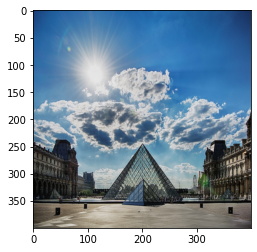

In [43]:
img_size = 400
content_path = "louvre.jpg"
# original image is (300, 400, 3)

content_image = np.array(Image.open(content_path).resize((img_size, img_size)))   # Now shape is 400, 400, 3
content_image = np.reshape(content_image, ((1,) + content_image.shape ))                # Now (1, 400, 400, 3)                
content_image = tf.constant(content_image)    # Convert to tensor

print(content_image.shape)
imshow(content_image[0])
plt.show()

<h5> Load style image </h5>

(1, 400, 400, 3)


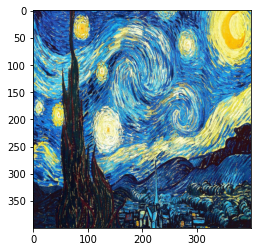

In [44]:
# original image once again (300, 400, 3)

style_path = "van_gogh.jpg"

style_image = np.array(Image.open(style_path).resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

<h5> Preprocess images </h5>

In [45]:
# Convert the values in content_image to float32 types between 0 and 1. Then save as tf Variable.
preprocessed_content = tf.Variable (tf.image.convert_image_dtype(content_image, tf.float32))        # (1, img_size, img_size, 3)

# Convert the values in style_image to float32 types between 0 and 1. Then save as tf Variable.
preprocessed_style = tf.Variable (tf.image.convert_image_dtype(style_image, tf.float32))            # (1, img_size, img_size, 3)

<h3> Load model </h3>

In [46]:
vgg_model = VGG19(
    include_top=False,
    weights='imagenet'
)
# Freeze weights
vgg_model.trainable = False
 
for layer in vgg_model.layers:
    print(layer.name)

input_3
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [47]:
# For the content layer, we will use 'block5_conv4' 
# For the style layers, we will use ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

In [48]:
vgg_model.input, vgg_model.get_layer('block1_conv1').output

(<KerasTensor: shape=(None, None, None, 3) dtype=float32 (created by layer 'input_3')>,
 <KerasTensor: shape=(None, None, None, 64) dtype=float32 (created by layer 'block1_conv1')>)

In [49]:
content_layer = 'block5_conv4'
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

content_model = Model(inputs = vgg_model.input, outputs = vgg_model.get_layer(content_layer).output)
style_models = [Model(inputs = vgg_model.input, outputs = vgg_model.get_layer(style_layer).output) for style_layer in style_layers]



<h3> Cost functions </h3>

<h5> 1) Content Cost </h5>

In [50]:
def content_cost (content, generated):
    """
    content, generated = 4D tensors
    """
    n_H, n_W, n_C = content[0].shape                    # content = (1,400,400,3)
    a_C = content_model(content)[0]
    a_G = content_model (generated)[0]
    content_cost = (1/(4*n_H*n_W*n_C))* tf.reduce_sum(tf.square(tf.subtract(a_C, a_G)))
    return content_cost

<h5> 2) Style Cost </h5>

In [51]:
def gram_matrix (A):
    gram = tf.linalg.matmul(A, tf.transpose(A))
    return gram

def style_cost(style_image, generated_image, style_weights = [0.2, 0.2, 0.2, 0.2, 0.2]):

    """
    inputs
    style_image = preprocessed_image, 4D tensor (1, n_H, n_W, n_C), with values from 0 to 1

    return
    total cost
    """

    J_style_total = 0

    for i, style_model in enumerate(style_models):
        a_S = style_model(style_image)[0]       # a_S = (n_H, n_W, n_C)
        a_G = style_model(generated_image)[0]   # a_G = (n_H, n_W, n_C)

        n_H, n_W, n_C = a_S.shape
        
        # Reshape the images from (n_H * n_W, n_C) to have them of shape (n_C, n_H * n_W)
        a_S = tf.reshape(a_S, shape = [n_H * n_W, n_C])
        a_S = tf.transpose(a_S, perm = [1,0])   # a_S = (n_C, n_H * n_W)

        a_G = tf.reshape(a_G, shape = [n_H * n_W, n_C])
        a_G = tf.transpose(a_G, perm = [1,0])   # a_G = (n_C, n_H * n_W)

        # Compute gram_matrices for both images S and G 
        GS = gram_matrix(a_S)
        GG = gram_matrix(a_G)

        # Compute style cost for current layer
        J_style_layer = (1/(4*n_C*n_C*(n_H*n_W)**2)) * tf.reduce_sum(tf.multiply(tf.subtract(GS, GG), tf.subtract(GS, GG)))

        # Update total

        J_style_total += style_weights[i]*J_style_layer

    return J_style_total




<h3> Necessary Post-processing Functions </h3>

In [52]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    During optimisation, we want to make sure the updated pixel values for the image stay within the range 0 to 1.

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Scales the tensor values (input values are between 0 and 1) back to range of 0 to 255.
    Also convert the values into integers.
    If tensor is 4D, then take only last 3 values.
    Convert this to PIL image.
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255                       # Convert values to range 0–255
    tensor = np.array(tensor, dtype=np.uint8)   # Convert into integer type
    if np.ndim(tensor) > 3:                     # If more than 3 dimensions, take only last 3 dimensions.
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

<h3> Optimise </h3>

In [53]:
type(preprocessed_content)

tensorflow.python.ops.resource_variable_ops.ResourceVariable

In [54]:
content = tf.identity(preprocessed_content)
style = tf.identity(preprocessed_style)
generated = tf.Variable(tf.identity(content))

opt = tf.keras.optimizers.Adam(learning_rate=0.01)  

with tf.GradientTape() as tape:
    J_content = content_cost(content, generated)
    J_style = style_cost(style, generated)
    J_total = 10 * J_content + 1000 * J_style

grads = tape.gradient(J_total, generated)           # J_total is y, generated is x; 
print (content[0,0,0], generated[0,0,0])
opt.apply_gradients([(grads, generated)])
print(content[0,0,0], generated[0,0,0])


tf.Tensor([0.09803922 0.23529413 0.454902  ], shape=(3,), dtype=float32) tf.Tensor([0.09803922 0.23529413 0.454902  ], shape=(3,), dtype=float32)
tf.Tensor([0.09803922 0.23529413 0.454902  ], shape=(3,), dtype=float32) tf.Tensor([0.08803893 0.22529384 0.4449017 ], shape=(3,), dtype=float32)


In [55]:
content [0,0,0], preprocessed_content[0,0,0]
content = content + 1
content [0,0,0], preprocessed_content[0,0,0]

(<tf.Tensor: shape=(3,), dtype=float32, numpy=array([1.0980393, 1.2352941, 1.4549019], dtype=float32)>,
 <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.09803922, 0.23529413, 0.454902  ], dtype=float32)>)

In [56]:
generated_images = []
def training_loop(preprocessed_content, preprocessed_style, iterations=500, a=10, b=1000, learning_rate = 0.1):
    # Notice that the weight for the style error is way bigger. Compensates for not adding noise to initial generated image.
    
    # load content and style images from their respective path
    content = tf.identity(preprocessed_content)         # use tf.identity to create deep copy
    style = tf.identity(preprocessed_style)
    generated = tf.Variable(tf.identity(content))       # use tf.Variable since "generated" will be updated
 
    opt = tf.keras.optimizers.Adam(learning_rate=learning_rate)  
 
    best_cost = 1000000000000000             # set to a huge number (original had "Inf")
    best_image = None
    for i in range(iterations):
        
        with tf.GradientTape() as tape:
            J_content = content_cost(content, generated)
            J_style = style_cost(style, generated)
            J_total = a * J_content + b * J_style
 
        grads = tape.gradient(J_total, generated)           # J_total is y, generated is x; 
        opt.apply_gradients([(grads, generated)])           # optimise x so as to minimise y.
        generated.assign(clip_0_1(generated))

        generated_images.append(generated)

        if J_total < best_cost:
            best_cost = J_total
            best_image = generated
        
        if i%10==0:
            image = tensor_to_image(best_image)
            print(f'Iteration: {i}')
            print(f'Total Loss: {J_total}')
            imshow(image)
            plt.show()

    
    best_image = tensor_to_image(best_image)                # Convert format of image (currently a tensor) ot image
 
    return best_image

Iteration: 0
Total Loss: 683246.875


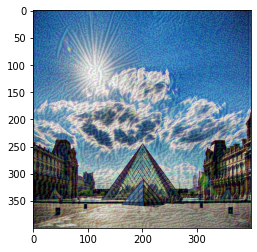

Iteration: 1
Total Loss: 203296.796875


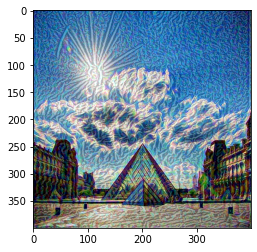

Iteration: 2
Total Loss: 174809.8125


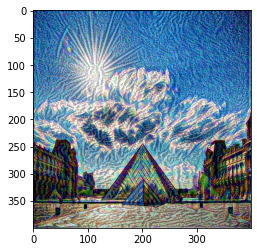

Iteration: 3
Total Loss: 196569.421875


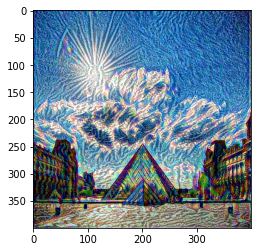

Iteration: 4
Total Loss: 113108.171875


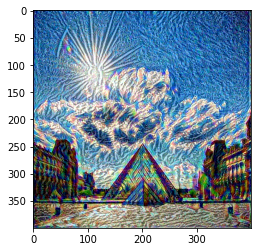

Iteration: 5
Total Loss: 93663.3515625


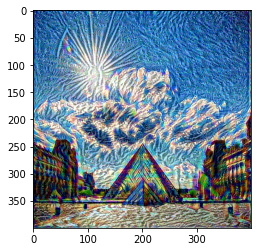

Iteration: 6
Total Loss: 74401.0078125


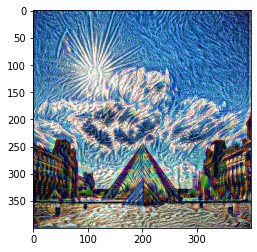

Iteration: 7
Total Loss: 69319.765625


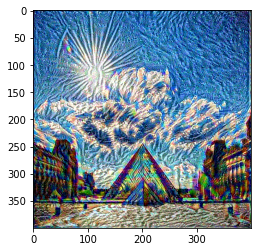

Iteration: 8
Total Loss: 51845.44921875


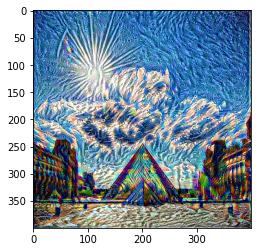

Iteration: 9
Total Loss: 40174.5390625


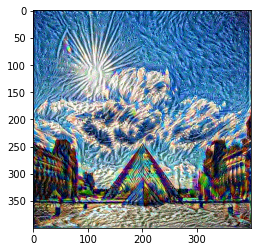

Iteration: 10
Total Loss: 36179.4453125


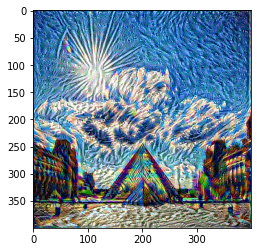

Iteration: 11
Total Loss: 30163.83203125


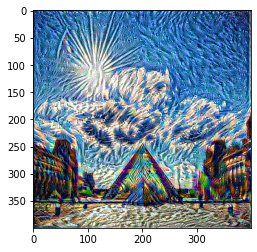

Iteration: 12
Total Loss: 29214.07421875


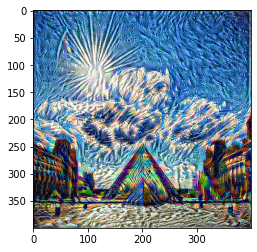

Iteration: 13
Total Loss: 24429.37890625


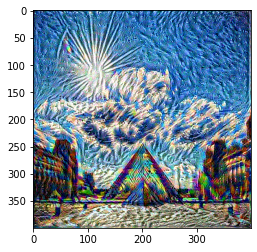

Iteration: 14
Total Loss: 21693.28515625


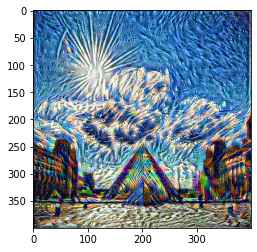

Iteration: 15
Total Loss: 19739.16015625


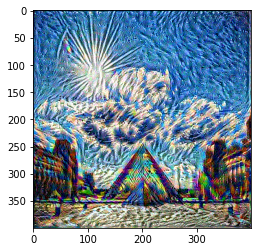

Iteration: 16
Total Loss: 17871.78515625


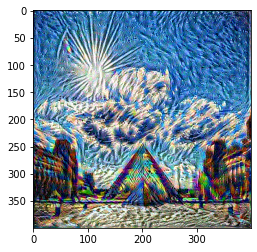

Iteration: 17
Total Loss: 16205.328125


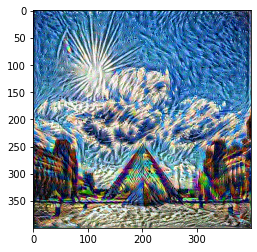

Iteration: 18
Total Loss: 14277.96875


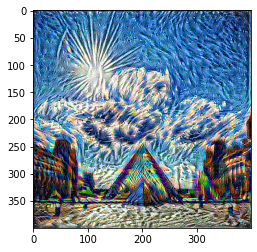

Iteration: 19
Total Loss: 13411.77734375


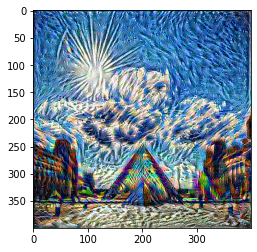

Iteration: 20
Total Loss: 12110.1396484375


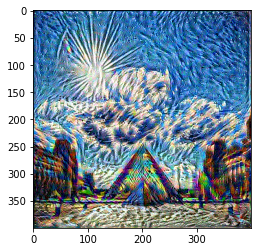

Iteration: 21
Total Loss: 11025.05859375


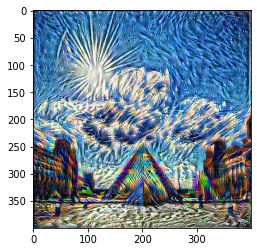

Iteration: 22
Total Loss: 10059.841796875


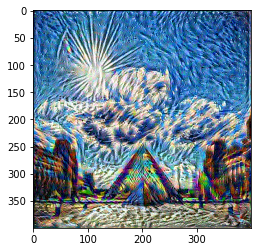

Iteration: 23
Total Loss: 9281.875


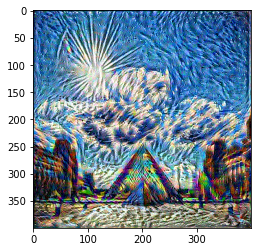

Iteration: 24
Total Loss: 8352.8603515625


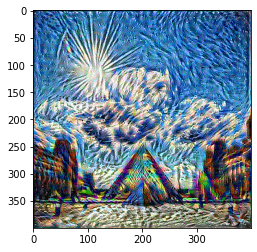

Iteration: 25
Total Loss: 8132.05078125


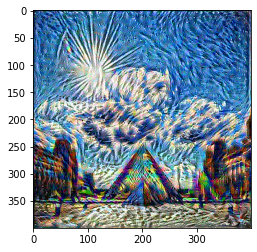

Iteration: 26
Total Loss: 7165.95068359375


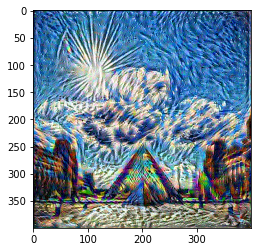

Iteration: 27
Total Loss: 6762.34765625


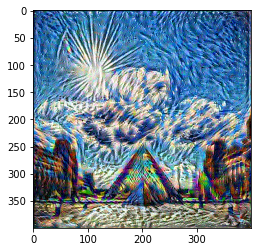

Iteration: 28
Total Loss: 6241.798828125


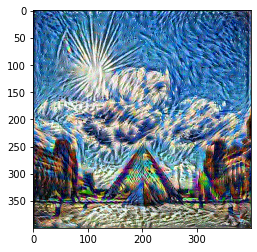

Iteration: 29
Total Loss: 5892.99755859375


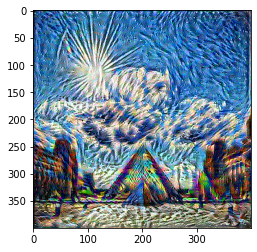

Iteration: 30
Total Loss: 5487.9599609375


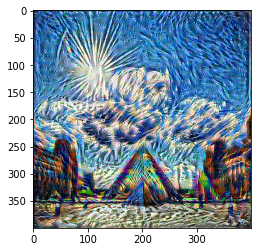

Iteration: 31
Total Loss: 5153.91552734375


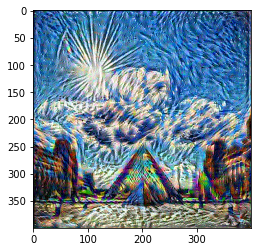

Iteration: 32
Total Loss: 4801.20361328125


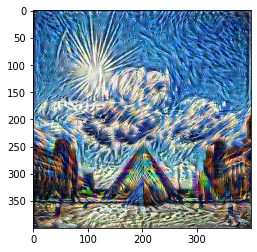

Iteration: 33
Total Loss: 4537.767578125


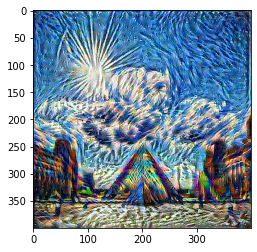

Iteration: 34
Total Loss: 4314.89501953125


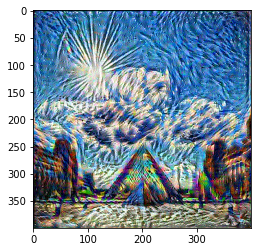

Iteration: 35
Total Loss: 4036.32080078125


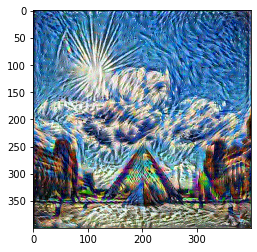

Iteration: 36
Total Loss: 3834.01025390625


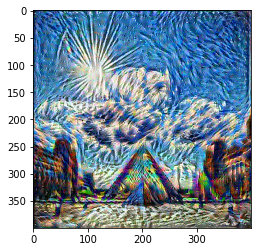

Iteration: 37
Total Loss: 3660.247802734375


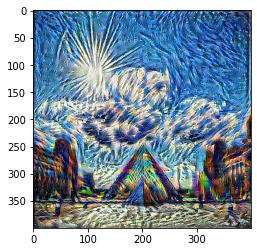

Iteration: 38
Total Loss: 3461.771728515625


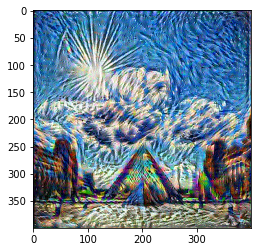

Iteration: 39
Total Loss: 3287.57666015625


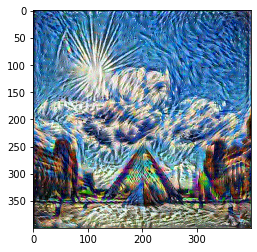

Iteration: 40
Total Loss: 3154.468505859375


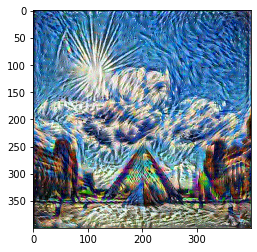

Iteration: 41
Total Loss: 2992.81201171875


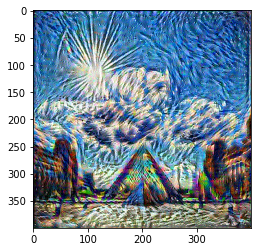

Iteration: 42
Total Loss: 2890.72412109375


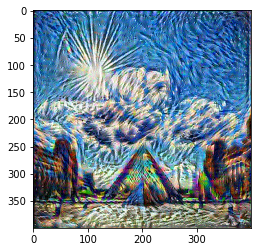

Iteration: 43
Total Loss: 2739.881591796875


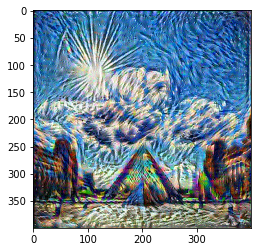

Iteration: 44
Total Loss: 2664.7255859375


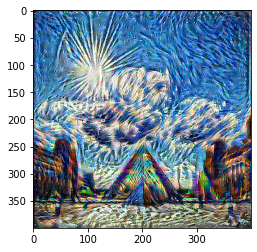

Iteration: 45
Total Loss: 2523.651611328125


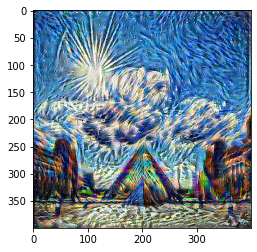

Iteration: 46
Total Loss: 2463.901123046875


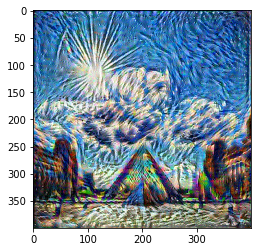

Iteration: 47
Total Loss: 2350.1376953125


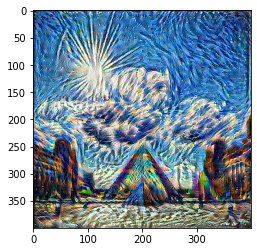

Iteration: 48
Total Loss: 2285.392822265625


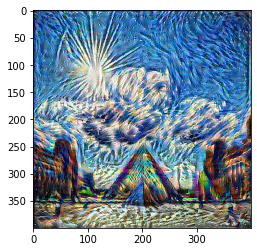

Iteration: 49
Total Loss: 2194.47216796875


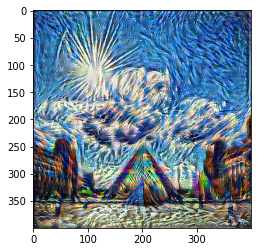

Iteration: 50
Total Loss: 2132.913330078125


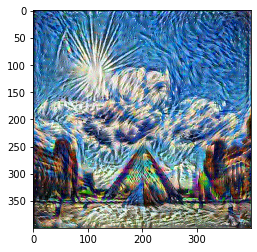

Iteration: 51
Total Loss: 2060.781982421875


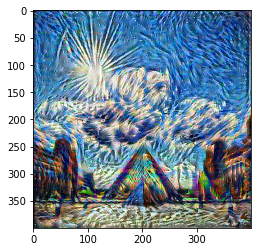

Iteration: 52
Total Loss: 1997.857666015625


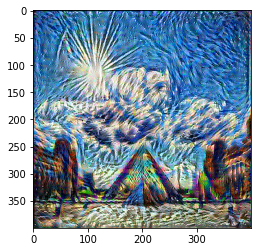

Iteration: 53
Total Loss: 1939.92138671875


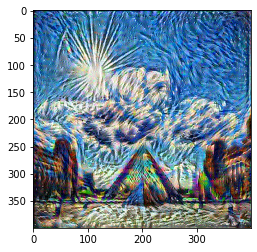

Iteration: 54
Total Loss: 1883.3812255859375


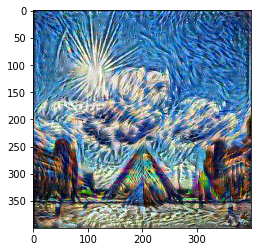

Iteration: 55
Total Loss: 1827.954833984375


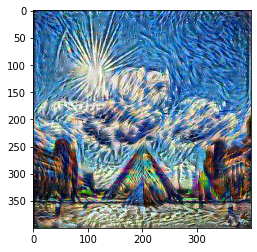

Iteration: 56
Total Loss: 1781.9947509765625


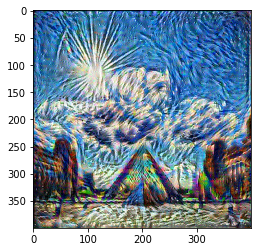

Iteration: 57
Total Loss: 1732.446044921875


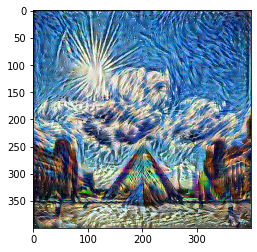

Iteration: 58
Total Loss: 1686.921630859375


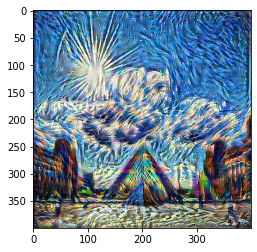

Iteration: 59
Total Loss: 1650.142578125


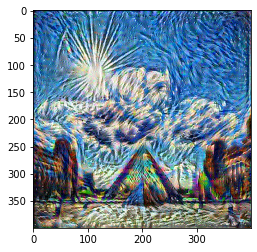

Iteration: 60
Total Loss: 1601.496337890625


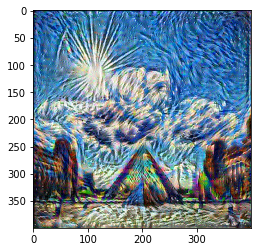

Iteration: 61
Total Loss: 1572.4110107421875


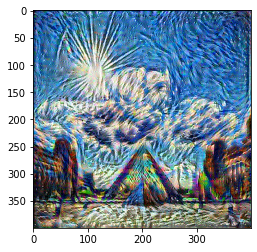

Iteration: 62
Total Loss: 1530.4755859375


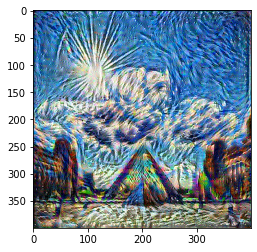

Iteration: 63
Total Loss: 1498.65283203125


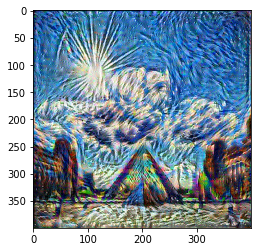

Iteration: 64
Total Loss: 1463.8721923828125


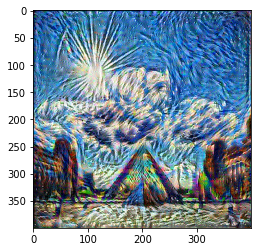

Iteration: 65
Total Loss: 1435.5103759765625


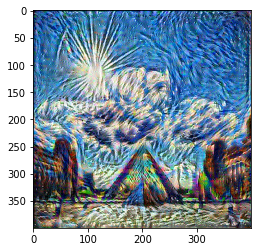

Iteration: 66
Total Loss: 1402.253173828125


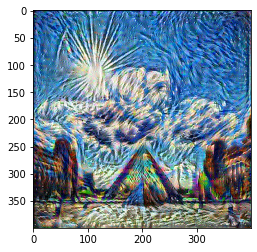

Iteration: 67
Total Loss: 1375.972412109375


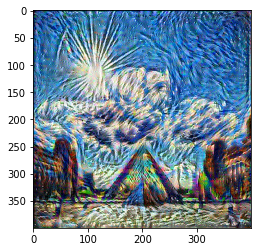

Iteration: 68
Total Loss: 1349.7762451171875


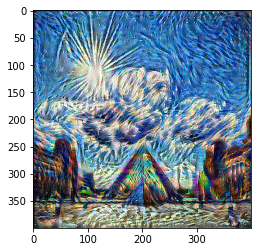

Iteration: 69
Total Loss: 1320.5963134765625


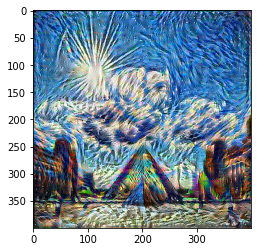

Iteration: 70
Total Loss: 1298.6815185546875


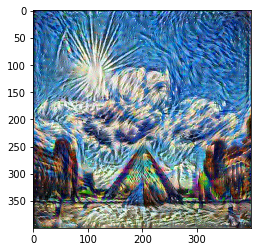

Iteration: 71
Total Loss: 1273.360107421875


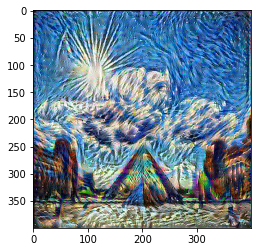

Iteration: 72
Total Loss: 1250.8961181640625


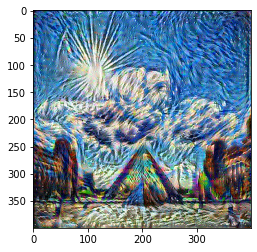

Iteration: 73
Total Loss: 1228.044189453125


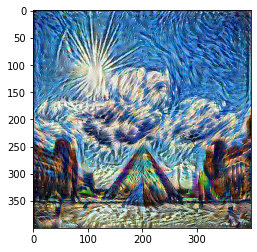

Iteration: 74
Total Loss: 1207.4298095703125


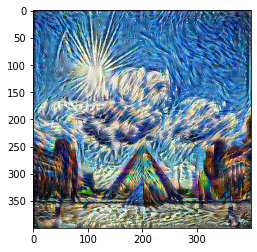

Iteration: 75
Total Loss: 1187.5465087890625


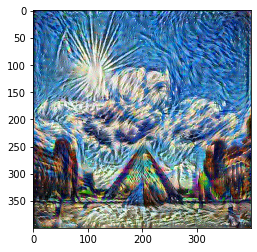

Iteration: 76
Total Loss: 1166.606689453125


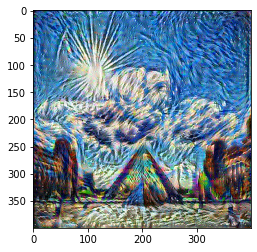

Iteration: 77
Total Loss: 1148.217041015625


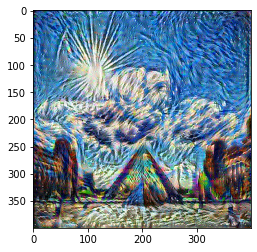

Iteration: 78
Total Loss: 1130.6597900390625


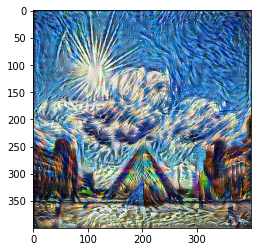

Iteration: 79
Total Loss: 1112.161865234375


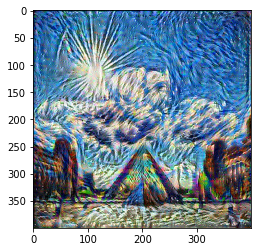

Iteration: 80
Total Loss: 1095.5029296875


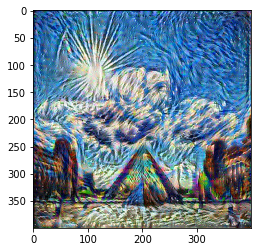

Iteration: 81
Total Loss: 1078.7340087890625


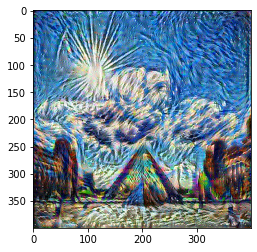

Iteration: 82
Total Loss: 1063.1722412109375


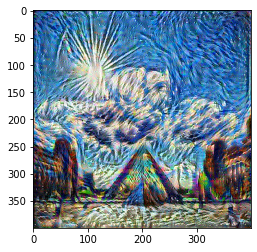

Iteration: 83
Total Loss: 1048.2430419921875


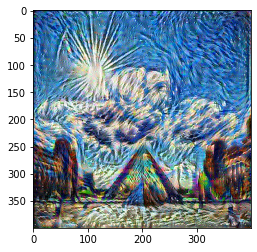

Iteration: 84
Total Loss: 1032.46484375


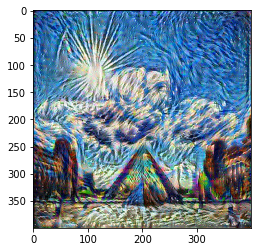

Iteration: 85
Total Loss: 1018.4156494140625


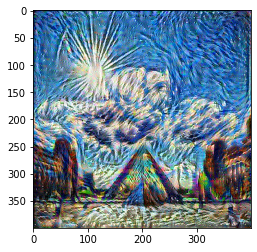

Iteration: 86
Total Loss: 1004.4757080078125


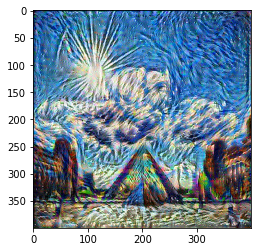

Iteration: 87
Total Loss: 990.9904174804688


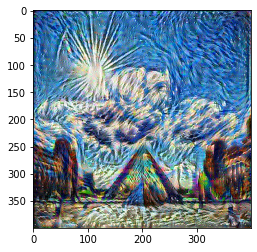

Iteration: 88
Total Loss: 978.0342407226562


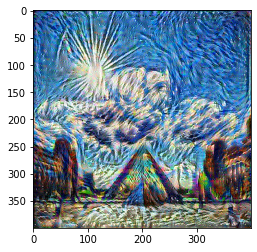

Iteration: 89
Total Loss: 964.9446411132812


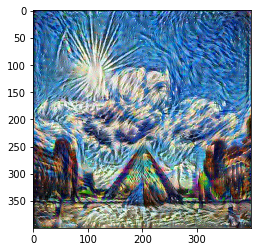

Iteration: 90
Total Loss: 952.4470825195312


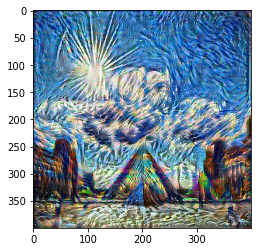

Iteration: 91
Total Loss: 940.4774169921875


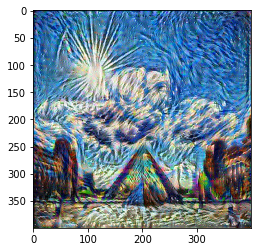

Iteration: 92
Total Loss: 928.7935180664062


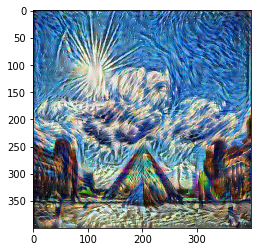

Iteration: 93
Total Loss: 917.3795776367188


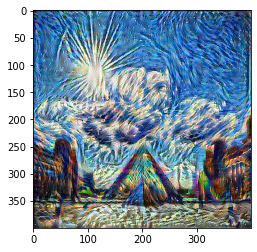

Iteration: 94
Total Loss: 906.334716796875


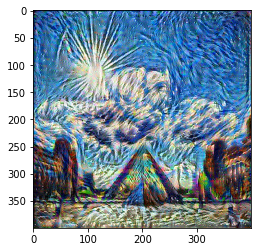

Iteration: 95
Total Loss: 895.3987426757812


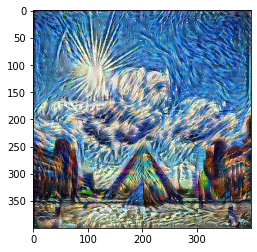

Iteration: 96
Total Loss: 884.6253051757812


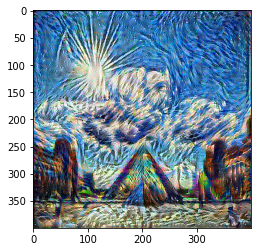

Iteration: 97
Total Loss: 874.3009643554688


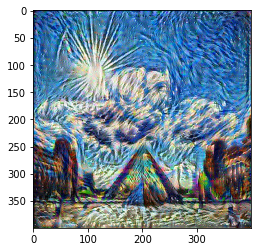

Iteration: 98
Total Loss: 864.1520385742188


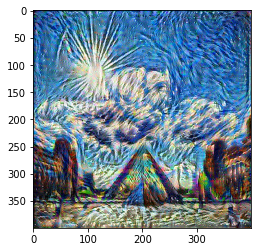

Iteration: 99
Total Loss: 854.1533813476562


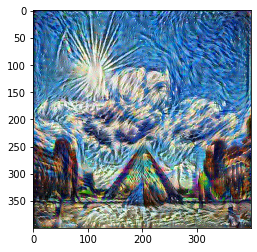

In [57]:
best_image = training_loop(preprocessed_content, preprocessed_style, iterations=100, a=10, b=1000, learning_rate = 0.07)

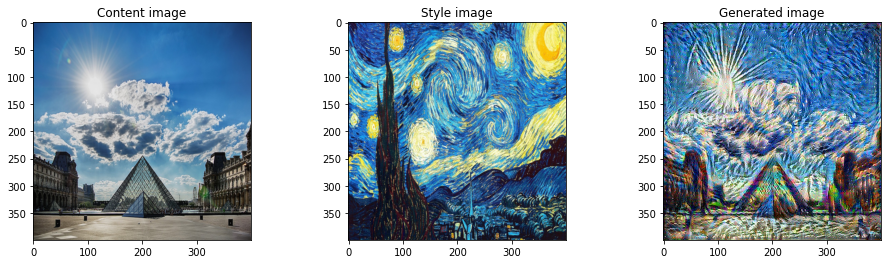

In [58]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(best_image)
ax.title.set_text('Generated image')
plt.show()